# Poincaré Disk Visualization of Node Trajectories
This notebook loads the saved embedding trajectory `traj.pt` (generated during HIM training) and visualizes selected nodes' movement on the Poincaré disk.

**Requirements**: `torch`, `matplotlib`


In [25]:
import torch
import matplotlib.pyplot as plt
from pathlib import Path

In [26]:
def lorentz_to_poincare(x: torch.Tensor, gamma: float = 1.0) -> torch.Tensor:
    """Convert Lorentz coordinates (x0, x1, …) to Poincaré disk coordinates."""
    sqrt_g = gamma ** 0.5
    return x[..., 1:] / (x[..., :1] + sqrt_g)

In [27]:
def get_node_iter(node_ids, total_nodes):
    """
    node_ids : None, 'all', or list[int]
       - None / 'all' →  range(total_nodes)
       - list         →  そのまま
    """
    if node_ids is None or (isinstance(node_ids, str) and node_ids.lower() == "all"):
        return range(total_nodes)
    return node_ids


In [28]:
# === Configuration ===
TRAJ_PATH = Path('traj.pt')   # same directory
NODE_IDS  = [100, 1854, 192, 119]    # edit as you like
# NODE_IDS  = None
GAMMA     = 1.0               # curvature parameter used in training

assert TRAJ_PATH.exists(), f'{TRAJ_PATH} not found'

traj = torch.load(TRAJ_PATH)   # list[Tensor] (epochs, N, d+1)
print(f'Loaded {len(traj)} epochs, {traj[0].shape[0]} nodes.')

/tmp/ipykernel_1732260/4248871745.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  traj = torch.load(TRAJ_PATH)   # list[Tensor] (epochs, N, d+1)


Loaded 300 epochs, 2000 nodes.


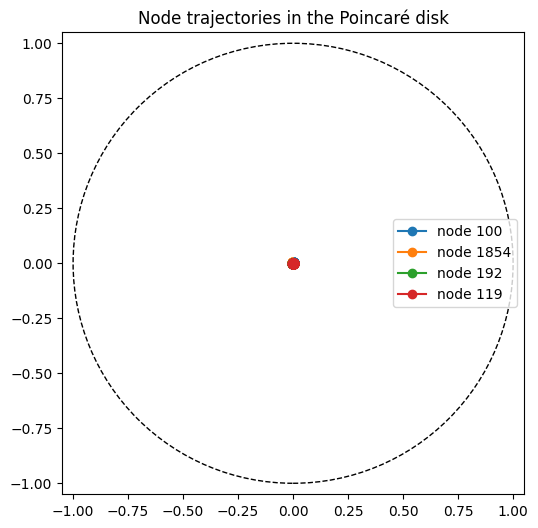

In [29]:
fig, ax = plt.subplots(figsize=(6,6))
# unit circle
circle = plt.Circle((0,0), 1.0, fill=False, linestyle='--')
ax.add_artist(circle)

for nid in get_node_iter(NODE_IDS, traj[0].shape[0]):
    pts = torch.stack([lorentz_to_poincare(epoch_emb[nid], GAMMA) for epoch_emb in traj])
    ax.plot(pts[:,0], pts[:,1], marker='o', label=f'node {nid}')

ax.set_aspect('equal')
ax.set_xlim(-1.05,1.05)
ax.set_ylim(-1.05,1.05)
ax.set_title('Node trajectories in the Poincaré disk')
ax.legend(loc='best')
plt.show()

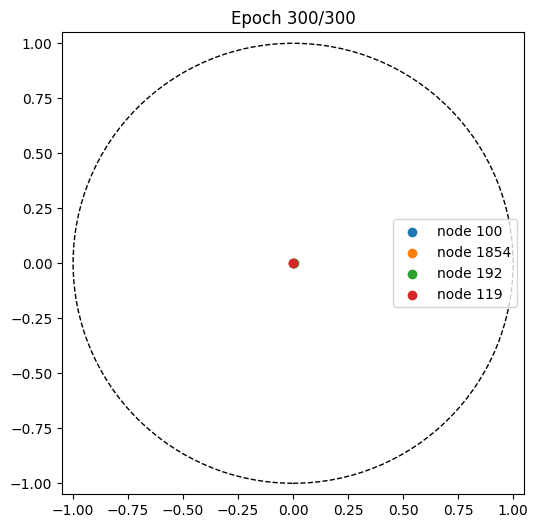

In [30]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
plt.rcParams['animation.embed_limit'] = 50 * 1024 * 1024  # 50MBをバイト単位で指定

FPS = 2                      # フレーム/秒（お好みで）

fig_anim, ax_anim = plt.subplots(figsize=(6, 6))
circ = plt.Circle((0, 0), 1.0, fill=False, linestyle="--")
ax_anim.add_artist(circ)
ax_anim.set_aspect("equal")
ax_anim.set_xlim(-1.05, 1.05)
ax_anim.set_ylim(-1.05, 1.05)

def lorentz_to_poincare(x, gamma=1.0, take_dims=(0, 1)):
    """
    Lorentz 座標 (x0, x1, …, xd) → Poincaré 座標 (y1, y2) へ変換。
    `take_dims` で表示したい 2 次元を指定する。
    """
    import torch  # 念のため
    sqrt_g = gamma ** 0.5
    y = x[..., 1:] / (x[..., :1] + sqrt_g)   # shape (..., d)
    return y[..., list(take_dims)]


# ── scatter をノードごとに用意 ──────────────────
scatters = {}
for nid in get_node_iter(NODE_IDS, traj[0].shape[0]):
    x0, y0 = lorentz_to_poincare(traj[0][nid], GAMMA, take_dims=(0, 1))
    scat = ax_anim.scatter([x0], [y0], label=f"node {nid}")
    scatters[nid] = scat

ax_anim.legend(loc="best")

def update(frame):
    """frame 番目のエポック位置に scatter を移動"""
    for nid in get_node_iter(NODE_IDS, traj[0].shape[0]):
        x, y = lorentz_to_poincare(traj[frame][nid], GAMMA, take_dims=(0, 1))
        scatters[nid].set_offsets([[x, y]])
    ax_anim.set_title(f"Epoch {frame+1}/{len(traj)}")
    return scatters.values()

ani = FuncAnimation(
    fig_anim,
    update,
    frames=len(traj),
    interval=1000 // FPS,   # ms
    blit=True,
)

# ── Notebook にインライン表示（HTML5 動画）────────
HTML(ani.to_jshtml())        # or ani.to_html5_video()
